In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')

In [2]:
#load data
data = pd.read_csv('https://sue-data.s3.ap-northeast-2.amazonaws.com/geo_payment_final.csv')

In [3]:
data.head()

,Unnamed: 0,customer_id,order_id,customer_city,customer_state,customer_zip_code_prefix,order_status,order_purchase_timestamp,payment_value,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,0,06b8999e2fba1a1fbc88172c00ba8bc7,00e7ee1b050b8499577073aeb2a297a1,franca,SP,14409,delivered,2017-05-16 15:05:35,146.87,-20.509897,-47.397866,franca,SP
1,1,5dca924cc99eea2dc5ba40d11ec5dd0f,95261f608a64bbbe760a212b4d48a4ee,franca,SP,14409,delivered,2018-06-15 20:07:13,94.77,-20.509897,-47.397866,franca,SP
2,2,661897d4968f1b59bfff74c7eb2eb4fc,9444fa2ab50a3f5af63b48be297eda24,franca,SP,14409,delivered,2017-09-09 15:40:00,62.50,-20.509897,-47.397866,franca,SP
3,3,702b62324327ccba20f1be3465426437,dceb8e88274c6f42a88a76ed979eb817,franca,SP,14409,delivered,2018-03-26 12:04:55,32.69,-20.509897,-47.397866,franca,SP
4,4,bdf997bae7ca819b0415f5174d6b4302,6ee1cea1b2edcc713f83ebfbccbc57f9,franca,SP,14409,delivered,2018-07-29 20:39:20,77.01,-20.509897,-47.397866,franca,SP


In [4]:
data.shape

(102291, 13)

In [5]:
data

,Unnamed: 0,customer_id,order_id,customer_city,customer_state,customer_zip_code_prefix,order_status,order_purchase_timestamp,payment_value,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,0,06b8999e2fba1a1fbc88172c00ba8bc7,00e7ee1b050b8499577073aeb2a297a1,franca,SP,14409,delivered,2017-05-16 15:05:35,146.87,-20.509897,-47.397866,franca,SP
1,1,5dca924cc99eea2dc5ba40d11ec5dd0f,95261f608a64bbbe760a212b4d48a4ee,franca,SP,14409,delivered,2018-06-15 20:07:13,94.77,-20.509897,-47.397866,franca,SP
2,2,661897d4968f1b59bfff74c7eb2eb4fc,9444fa2ab50a3f5af63b48be297eda24,franca,SP,14409,delivered,2017-09-09 15:40:00,62.50,-20.509897,-47.397866,franca,SP
3,3,702b62324327ccba20f1be3465426437,dceb8e88274c6f42a88a76ed979eb817,franca,SP,14409,delivered,2018-03-26 12:04:55,32.69,-20.509897,-47.397866,franca,SP
4,4,bdf997bae7ca819b0415f5174d6b4302,6ee1cea1b2edcc713f83ebfbccbc57f9,franca,SP,14409,delivered,2018-07-29 20:39:20,77.01,-20.509897,-47.397866,franca,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102286,102286,0b7a30ba373aeb55cf28add5b5477956,e12f5458c6b4f349a97fbf22e08d17ac,paicandu,PR,87145,delivered,2017-08-01 12:57:02,77.57,-23.501992,-52.150755,paicandu,PR
102287,102287,ff6b440b2465bfaef05c675efb48cd15,82a11e82ea02c7e3381366e935c1126e,eugenio de castro,RS,98860,delivered,2018-05-23 09:07:46,111.76,-28.525792,-54.145061,eugenio de castro,RS
102288,102288,3f7029d9b98a47370cd5f3a97adcbccd,6e9f8d6156d8c37f0e0e6351908de639,sao paulo,SP,5538,delivered,2018-03-28 12:28:04,75.59,-23.588504,-46.737870,sao paulo,SP
102289,102289,d9110683c7a282144e9fc97660026a28,e65fa5f31ce4436d38bcf5e109fd43e4,aparecida de goiania,GO,74980,delivered,2018-01-24 17:53:44,159.77,-16.823261,-49.247368,aparecida de goiania,GO


In [6]:
data.columns

Index(['Unnamed: 0', 'customer_id', 'order_id', 'customer_city',
       'customer_state', 'customer_zip_code_prefix', 'order_status',
       'order_purchase_timestamp', 'payment_value', 'geolocation_lat',
       'geolocation_lng', 'geolocation_city', 'geolocation_state'],
      dtype='object')

In [7]:
data['customer_state'] = data['customer_state'].replace({
    'AC':'Acre',
    'AL':'Alagoas',
    'AP':'Amapá',
    'AM':'Amazonas',
    'BA':'Bahia',
    'CE':'Ceará',
    'DF':'Distrito Federal',
    'ES':'Espírito Santo',
    'GO':'Goiás',
    'MA':'Maranhão',
    'MT':'Mato Grosso',
    'MS':'Mato Grosso do Sul',
    'MG':'Minas Gerais',
    'PA':'Pará',
    'PB':'Paraíba',
    'PR':'Paraná',
    'PE':'Pernambuco',
    'PI':'Piauí',
    'RJ':'Rio de Janeiro',
    'RN':'Rio Grande do Norte',
    'RS':'Rio Grande do Sul',
    'RO':'Rondônia',
    'RR':'Roraima',
    'SC':'Santa Catarina',
    'SP':'São Paulo',
    'SE':'Sergipe',
    'TO':'Tocantins'
        })

In [8]:
data

,Unnamed: 0,customer_id,order_id,customer_city,customer_state,customer_zip_code_prefix,order_status,order_purchase_timestamp,payment_value,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,0,06b8999e2fba1a1fbc88172c00ba8bc7,00e7ee1b050b8499577073aeb2a297a1,franca,São Paulo,14409,delivered,2017-05-16 15:05:35,146.87,-20.509897,-47.397866,franca,SP
1,1,5dca924cc99eea2dc5ba40d11ec5dd0f,95261f608a64bbbe760a212b4d48a4ee,franca,São Paulo,14409,delivered,2018-06-15 20:07:13,94.77,-20.509897,-47.397866,franca,SP
2,2,661897d4968f1b59bfff74c7eb2eb4fc,9444fa2ab50a3f5af63b48be297eda24,franca,São Paulo,14409,delivered,2017-09-09 15:40:00,62.50,-20.509897,-47.397866,franca,SP
3,3,702b62324327ccba20f1be3465426437,dceb8e88274c6f42a88a76ed979eb817,franca,São Paulo,14409,delivered,2018-03-26 12:04:55,32.69,-20.509897,-47.397866,franca,SP
4,4,bdf997bae7ca819b0415f5174d6b4302,6ee1cea1b2edcc713f83ebfbccbc57f9,franca,São Paulo,14409,delivered,2018-07-29 20:39:20,77.01,-20.509897,-47.397866,franca,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102286,102286,0b7a30ba373aeb55cf28add5b5477956,e12f5458c6b4f349a97fbf22e08d17ac,paicandu,Paraná,87145,delivered,2017-08-01 12:57:02,77.57,-23.501992,-52.150755,paicandu,PR
102287,102287,ff6b440b2465bfaef05c675efb48cd15,82a11e82ea02c7e3381366e935c1126e,eugenio de castro,Rio Grande do Sul,98860,delivered,2018-05-23 09:07:46,111.76,-28.525792,-54.145061,eugenio de castro,RS
102288,102288,3f7029d9b98a47370cd5f3a97adcbccd,6e9f8d6156d8c37f0e0e6351908de639,sao paulo,São Paulo,5538,delivered,2018-03-28 12:28:04,75.59,-23.588504,-46.737870,sao paulo,SP
102289,102289,d9110683c7a282144e9fc97660026a28,e65fa5f31ce4436d38bcf5e109fd43e4,aparecida de goiania,Goiás,74980,delivered,2018-01-24 17:53:44,159.77,-16.823261,-49.247368,aparecida de goiania,GO


In [9]:
data['customer_city'].value_counts()

sao paulo                15951
rio de janeiro            7124
belo horizonte            2834
brasilia                  1999
curitiba                  1557
                         ...  
ubai                         1
santa amelia                 1
senador salgado filho        1
joaquim pires                1
santa brigida                1
Name: customer_city, Length: 4065, dtype: int64

In [10]:
data.groupby('customer_state')['customer_city'].count()

customer_state
Acre                      84
Alagoas                  424
Amapá                     70
Amazonas                 153
Bahia                   3564
Ceará                   1381
Distrito Federal        2010
Espírito Santo          2085
Goiás                   2080
Maranhão                 752
Mato Grosso              951
Mato Grosso do Sul       729
Minas Gerais           11942
Paraná                  5178
Paraíba                  563
Pará                    1001
Pernambuco              1714
Piauí                    515
Rio Grande do Norte      517
Rio Grande do Sul       5612
Rio de Janeiro         13353
Rondônia                 252
Roraima                   45
Santa Catarina          3716
Sergipe                  354
São Paulo              42948
Tocantins                298
Name: customer_city, dtype: int64

In [11]:
#change purchase time to datetime
data['order_purchase_timestamp'] = pd.to_datetime(data['order_purchase_timestamp'])

In [12]:
data.dtypes

Unnamed: 0                           int64
customer_id                         object
order_id                            object
customer_city                       object
customer_state                      object
customer_zip_code_prefix             int64
order_status                        object
order_purchase_timestamp    datetime64[ns]
payment_value                      float64
geolocation_lat                    float64
geolocation_lng                    float64
geolocation_city                    object
geolocation_state                   object
dtype: object

In [13]:
#check for null
data.isnull().sum()

Unnamed: 0                  0
customer_id                 0
order_id                    0
customer_city               0
customer_state              0
customer_zip_code_prefix    0
order_status                0
order_purchase_timestamp    0
payment_value               0
geolocation_lat             0
geolocation_lng             0
geolocation_city            0
geolocation_state           0
dtype: int64

In [14]:
data = data[(data['payment_value']>0)]

In [15]:
data.shape

(102285, 13)

## Preparing Datamart for RFM

In [16]:
data['order_purchase_timestamp'].min(), data['order_purchase_timestamp'].max()

(Timestamp('2016-09-04 21:15:19'), Timestamp('2018-09-03 09:06:57'))

In [17]:
#create hypothetical snapshot_day as if we are doing analysis recently
import datetime

snapshot_day = data['order_purchase_timestamp'].max() + datetime.timedelta(days=1)
print(snapshot_day)

2018-09-04 09:06:57


In [18]:
rfm = data.groupby('customer_id').agg({
    'order_purchase_timestamp': lambda date: (snapshot_day - date.max()).days,
    'order_id' : lambda order: len(order),
    'payment_value' : lambda payment: payment.sum()
})

In [19]:
rfm = rfm.rename(columns={
    'order_purchase_timestamp': 'Recency',
    'order_id': 'Frequency',
    'payment_value': 'Monetary'
})

In [20]:
rfm['Recency'] = rfm['Recency'].astype(int)

In [21]:
rfm.shape

(97932, 3)

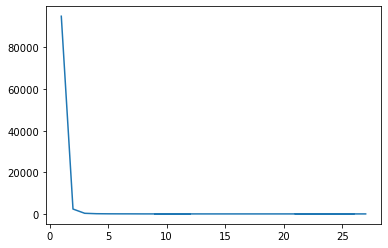

In [22]:
#quick view on distribution of Frequency
rfm.Frequency.value_counts().plot()

In [23]:
rfm.Frequency.value_counts().nlargest(10)

1     95020
2      2343
3       301
4       103
5        52
6        35
7        28
8        10
12        8
11        8
Name: Frequency, dtype: int64

In [24]:
rfm.Monetary.nlargest(5), rfm.Monetary.nsmallest(5)

(customer_id
 1617b1357756262bfa56ab541c47bc16    13664.08
 ec5b2ba62e574342386871631fafd3fc     7274.88
 c6e2731c5b391845f6800c97401a43a9     6929.31
 f48d464a0baaea338cb25f816991ab1f     6922.21
 3fd6777bbce08a352fddd04e4a7cc8f6     6726.66
 Name: Monetary, dtype: float64,
 customer_id
 a790343ca6f3fee08112d678b43aa7c5     9.59
 184e8e8e48937145eb96c721ef1f0747    10.07
 8e4bd65db637116b6b68109e4df21b84    10.89
 046f890135acc703faff4c1fc0c2d73c    11.56
 d2c63ad286e3ca9dd69218008d61ff81    11.62
 Name: Monetary, dtype: float64)

In [25]:
rfm.head()

,Recency,Frequency,Monetary
customer_id,,,
00012a2ce6f8dcda20d059ce98491703,293,1,114.74
000161a058600d5901f007fab4c27140,414,1,67.41
0001fd6190edaaf884bcaf3d49edf079,552,1,195.42
0002414f95344307404f0ace7a26f1d5,383,1,179.35
000379cdec625522490c315e70c7a9fb,154,1,107.01


In [92]:
rfm.to_csv('./rfm_original.csv')

### Building RFM Segments

In [26]:
# Create labels for Recency 
r_labels = range(3, 0, -1)
# Assign label to three equal percentile groups 
r_groups = pd.qcut(rfm['Recency'], q=3, labels=r_labels)
rfm = rfm.assign(R=r_groups.values)

In [27]:
rfm.dtypes

Recency         int32
Frequency       int64
Monetary      float64
R            category
dtype: object

In [28]:
rfm = rfm.sort_values(by='Frequency', ascending=False)

In [29]:
# Assign label to percentile group for Frequency
def group(x):
    if x ==1: return 1
    else: return 2

In [30]:
rfm['F'] = rfm['Frequency'].map(lambda x: group(x))

In [31]:
rfm.F.value_counts()

1    95020
2     2912
Name: F, dtype: int64

In [32]:
rfm.R.value_counts()

3    32776
2    32634
1    32522
Name: R, dtype: int64

In [33]:
# Create labels for MonetaryValue 
m_labels = range(1, 4)

# Assign these labels to three equal percentile groups
m_groups = pd.qcut(rfm['Monetary'], q=3, labels=m_labels)

# Create new column M
rfm = rfm.assign(M=m_groups.values)

In [34]:
# Calculate RFM_Score
rfm['RFM_score'] = rfm[['R','F','M']].sum(axis=1)

In [106]:
rfm

,Recency,Frequency,Monetary,R,F,M,RFM_score,RFM_level,Frequency_log
customer_id,,,,,,,,,
9af2372a1e49340278e7c1ef8d749f34,501,27,457.99,1,2,3,6.0,Middle,3.295837
92cd3ec6e2d643d4ebd0e3d6238f69e2,453,26,62.68,1,2,1,4.0,Low,3.258097
b246eeed30b362c09d867b9e598bee51,269,22,40.85,2,2,1,5.0,Middle,3.091042
270c23a11d024a44c896d1894b261a83,391,21,161.32,1,2,3,6.0,Middle,3.044522
eed931d3a5222a9a511d18be7fd2a5ba,479,19,82.73,1,2,2,5.0,Middle,2.944439
...,...,...,...,...,...,...,...,...,...
56de1e86668961e5442c922e3762b620,17,1,175.90,3,1,3,7.0,Top,0.000000
56dde5ae4a599923a54ea1c9a64c3094,85,1,153.40,3,1,3,7.0,Top,0.000000
56dde41c7bb48ff317cf71625ee3b33c,335,1,96.80,1,1,2,4.0,Low,0.000000


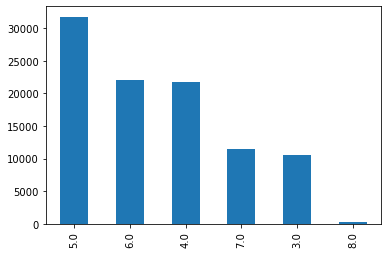

In [35]:
rfm.RFM_score.value_counts().plot(kind='bar')

In [95]:
rfm

,Recency,Frequency,Monetary,R,F,M,RFM_score,RFM_level
customer_id,,,,,,,,
9af2372a1e49340278e7c1ef8d749f34,501,27,457.99,1,2,3,6.0,Middle
92cd3ec6e2d643d4ebd0e3d6238f69e2,453,26,62.68,1,2,1,4.0,Low
b246eeed30b362c09d867b9e598bee51,269,22,40.85,2,2,1,5.0,Middle
270c23a11d024a44c896d1894b261a83,391,21,161.32,1,2,3,6.0,Middle
eed931d3a5222a9a511d18be7fd2a5ba,479,19,82.73,1,2,2,5.0,Middle
...,...,...,...,...,...,...,...,...
56de1e86668961e5442c922e3762b620,17,1,175.90,3,1,3,7.0,Top
56dde5ae4a599923a54ea1c9a64c3094,85,1,153.40,3,1,3,7.0,Top
56dde41c7bb48ff317cf71625ee3b33c,335,1,96.80,1,1,2,4.0,Low


In [108]:
# calculate averae values for each RFM
rfm_agg = rfm.groupby('RFM_score').agg({
    'Recency' : 'mean',
    'Frequency' : 'mean',
    'Monetary' : 'mean'
}).round(1)

In [109]:
rfm_agg

,Recency,Frequency,Monetary
RFM_score,,,
3.0,428.1,1.0,49.3
4.0,328.9,1.0,76.8
5.0,247.2,1.0,161.2
6.0,159.1,1.1,206.1
7.0,87.7,1.1,324.0
8.0,80.6,2.4,361.6


In [37]:
# Define rfm_level function
def rfm_level(df):
    if df['RFM_score'] >= 7: 
        return 'Top'
    elif ((df['RFM_score'] >= 5) and (df['RFM_score'] < 7)):
        return 'Middle'
    else:
        return 'Low'

# Create a new variable RFM_Level
rfm['RFM_level'] = rfm.apply(rfm_level, axis=1)

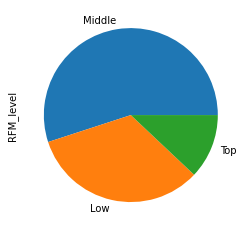

In [38]:
rfm.RFM_level.value_counts().plot(kind='pie')

In [93]:
# calculate averae values for each RFM level
rfm_agg2 = rfm.groupby('RFM_level').agg({
    'Recency' : 'mean',
    'Frequency' : 'mean',
    'Monetary' : ['mean', 'count']
}).round(1)

In [94]:
rfm_agg2

Recency Frequency Monetary       
             mean      mean     mean  count
RFM_level                                  
Low         361.2       1.0     67.8  32275
Middle      211.0       1.0    179.6  53876
Top          87.6       1.1    324.9  11781

## K-Means Clustering

### data preprocessing for K-Means
K-means gives the best result under the following conditions:

1. Data’s distribution is not skewed (i.e. long-tail distribution)
2. Data is standardised (i.e. mean of 0 and standard deviation of 1)

In [96]:
rfm

,Recency,Frequency,Monetary,R,F,M,RFM_score,RFM_level
customer_id,,,,,,,,
9af2372a1e49340278e7c1ef8d749f34,501,27,457.99,1,2,3,6.0,Middle
92cd3ec6e2d643d4ebd0e3d6238f69e2,453,26,62.68,1,2,1,4.0,Low
b246eeed30b362c09d867b9e598bee51,269,22,40.85,2,2,1,5.0,Middle
270c23a11d024a44c896d1894b261a83,391,21,161.32,1,2,3,6.0,Middle
eed931d3a5222a9a511d18be7fd2a5ba,479,19,82.73,1,2,2,5.0,Middle
...,...,...,...,...,...,...,...,...
56de1e86668961e5442c922e3762b620,17,1,175.90,3,1,3,7.0,Top
56dde5ae4a599923a54ea1c9a64c3094,85,1,153.40,3,1,3,7.0,Top
56dde41c7bb48ff317cf71625ee3b33c,335,1,96.80,1,1,2,4.0,Low


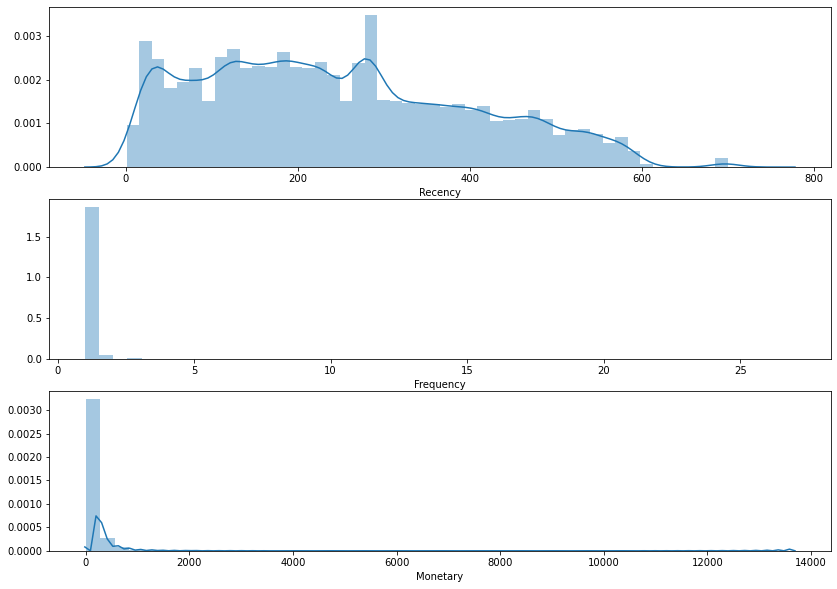

In [40]:
plt.figure(figsize=(14,10))
# Plot distribution of Recency
plt.subplot(3, 1, 1); sns.distplot(rfm['Recency'])

# Plot distribution of Frequency
plt.subplot(3, 1, 2); sns.distplot(rfm['Frequency'])

# Plot distribution of Monetary
plt.subplot(3, 1, 3); sns.distplot(rfm['Monetary'])

# Show the plot
plt.show()

In [98]:
rfm_datamart = rfm[['Recency','Frequency','Monetary']]
rfm_datamart.describe().round(1)

,Recency,Frequency,Monetary
count,97932.0,97932.0,97932.0
mean,245.7,1.0,160.3
std,153.3,0.4,219.2
min,1.0,1.0,9.6
25%,122.0,1.0,62.0
50%,227.0,1.0,105.3
75%,355.0,1.0,176.7
max,729.0,27.0,13664.1


### unskew the data -  log transformation

In [42]:
rfm_datamart_log = np.log(rfm_datamart)

In [102]:
rfm_datamart_log.describe()

,Recency,Frequency,Monetary
count,97932.000000,97932.000000,97932.000000
mean,5.218710,0.024709,4.692573
std,0.878323,0.152578,0.808714
min,0.000000,0.000000,2.260721
25%,4.804021,0.000000,4.126973
50%,5.424950,0.000000,4.656718
75%,5.872118,0.000000,5.174567
max,6.591674,3.295837,9.522526


<IPython.core.display.Javascript object>


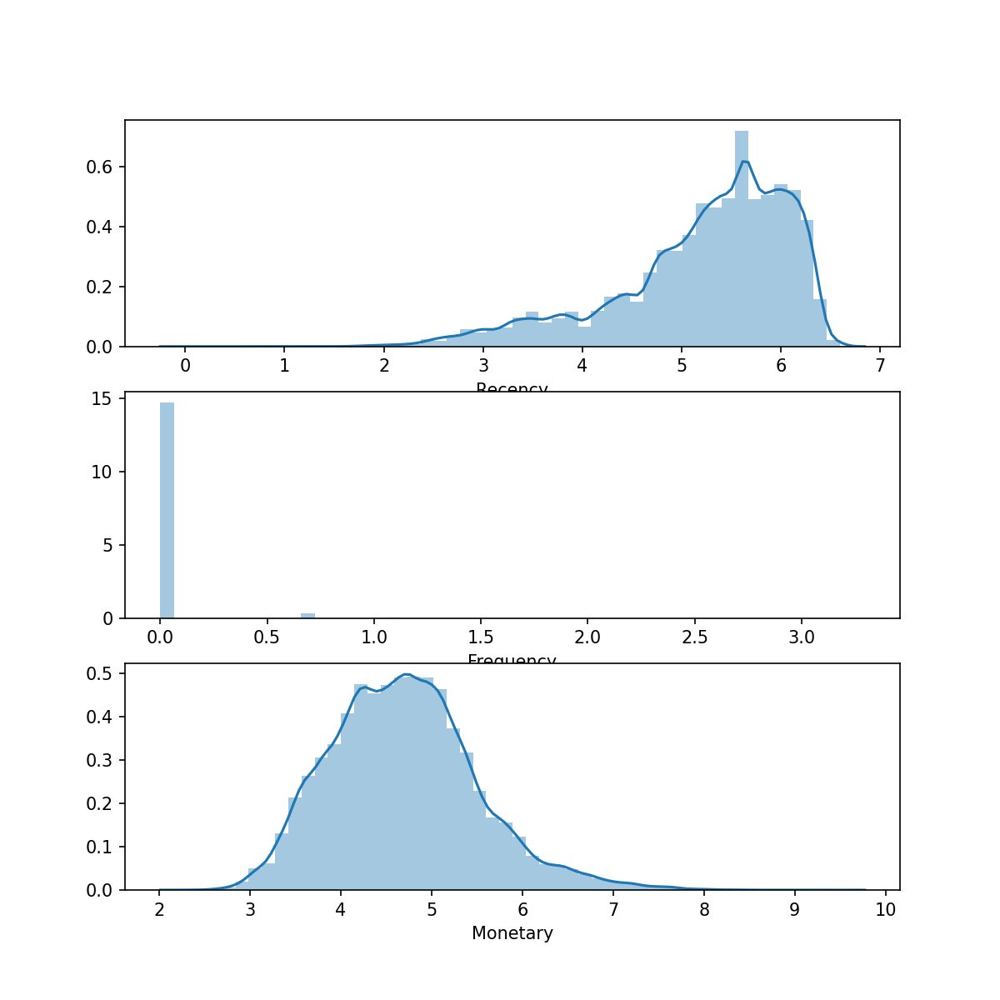

In [117]:
plt.figure(figsize=(8,8))
# Plot distribution of Recency
plt.subplot(3, 1, 1); sns.distplot(rfm_datamart_log['Recency'])

# Plot distribution of Frequency
plt.subplot(3, 1, 2); sns.distplot(rfm_datamart_log['Frequency'])

# Plot distribution of Monetary
plt.subplot(3, 1, 3); sns.distplot(rfm_datamart_log['Monetary'])

# Show the plot
plt.show()

In [126]:
rfm_datamart['Monetary_log'] = np.log(rfm_datamart['Monetary'])
rfm_datamart['Recency_log'] = np.log(rfm_datamart['Recency'])

In [122]:
rfm_datamart_final = pd.DataFrame()
rfm_datamart_final['Recency'] = rfm_datamart['Recency_log']
rfm_datamart_final['Frequency'] = rfm_datamart['Frequency']
rfm_datamart_final['Monetary'] = rfm_datamart['Monetary_log']

In [ ]:
# Assign label to percentile group for Frequency
def group(x):
    if x ==1: return 1
    else: return 2

In [142]:
rfm_datamart.skew(), rfm_datamart.kurtosis()

(Recency           0.431537
 Frequency        23.706144
 Monetary          9.268055
 Frequency_log     7.647334
 Recency_log      -1.101179
 Monetary_log      0.521294
 dtype: float64,
 Recency           -0.677583
 Frequency        973.911414
 Monetary         244.387699
 Frequency_log     74.710607
 Recency_log        0.838447
 Monetary_log       0.549739
 dtype: float64)

In [143]:
measure=pd.DataFrame()

In [147]:
measure['skew'] = rfm_datamart.skew().round(3)

In [148]:
measure['kurtosis'] = rfm_datamart.kurtosis().round(3)

In [149]:
measure

,skew,kurtosis
Recency,0.432,-0.678
Frequency,23.706,973.911
Monetary,9.268,244.388
Frequency_log,7.647,74.711
Recency_log,-1.101,0.838
Monetary_log,0.521,0.550


In [123]:
rfm_datamart_final.describe().round(2)

,Recency,Frequency,Monetary
count,97932.00,97932.00,97932.00
mean,5.22,1.04,4.69
std,0.88,0.38,0.81
min,0.00,1.00,2.26
25%,4.80,1.00,4.13
50%,5.42,1.00,4.66
75%,5.87,1.00,5.17
max,6.59,27.00,9.52


In [111]:
rfm_datamart

,Recency,Frequency,Monetary,Frequency_log,Recency_log
customer_id,,,,,
9af2372a1e49340278e7c1ef8d749f34,501,27,457.99,3.295837,6.216606
92cd3ec6e2d643d4ebd0e3d6238f69e2,453,26,62.68,3.258097,6.115892
b246eeed30b362c09d867b9e598bee51,269,22,40.85,3.091042,5.594711
270c23a11d024a44c896d1894b261a83,391,21,161.32,3.044522,5.968708
eed931d3a5222a9a511d18be7fd2a5ba,479,19,82.73,2.944439,6.171701
...,...,...,...,...,...
56de1e86668961e5442c922e3762b620,17,1,175.90,0.000000,2.833213
56dde5ae4a599923a54ea1c9a64c3094,85,1,153.40,0.000000,4.442651
56dde41c7bb48ff317cf71625ee3b33c,335,1,96.80,0.000000,5.814131


In [104]:
rfm['Frequency_log'] = np.log(rfm['Frequency'])

In [105]:
rfm.describe()

,Recency,Frequency,Monetary,F,RFM_score,Frequency_log
count,97932.000000,97932.000000,97932.00000,97932.000000,97932.000000,97932.000000
mean,245.688559,1.044449,160.26891,1.029735,5.032308,0.024709
std,153.258217,0.377794,219.18735,0.169856,1.171535,0.152578
min,1.000000,1.000000,9.59000,1.000000,3.000000,0.000000
25%,122.000000,1.000000,61.99000,1.000000,4.000000,0.000000
50%,227.000000,1.000000,105.29000,1.000000,5.000000,0.000000
75%,355.000000,1.000000,176.72000,1.000000,6.000000,0.000000
max,729.000000,27.000000,13664.08000,2.000000,8.000000,3.295837


In [100]:
rfm_datamart.describe()

,Recency,Frequency,Monetary,Frequency_log
count,97932.000000,97932.000000,97932.00000,97932.000000
mean,245.688559,1.044449,160.26891,0.024709
std,153.258217,0.377794,219.18735,0.152578
min,1.000000,1.000000,9.59000,0.000000
25%,122.000000,1.000000,61.99000,0.000000
50%,227.000000,1.000000,105.29000,0.000000
75%,355.000000,1.000000,176.72000,0.000000
max,729.000000,27.000000,13664.08000,3.295837


### centering & scaling method 1

In [113]:
# Center the data by subtracting average values from each entry
data_centered = rfm_datamart_final - rfm_datamart_final.mean()

# Scale the data by dividing each entry by standard deviation
data_scaled = rfm_datamart_final / rfm_datamart_final.std()

# Normalize the data by applying both centering and scaling
data_normalized = (rfm_datamart_final - rfm_datamart_final.mean()) / rfm_datamart_final.std()

# Print summary statistics to make sure average is zero and standard deviation is one
data_normalized.describe().round(2)

,Recency,Frequency
count,97932.00,97932.00
mean,-0.00,0.00
std,1.00,1.00
min,-5.94,-0.12
25%,-0.47,-0.12
50%,0.23,-0.12
75%,0.74,-0.12
max,1.56,68.70


<IPython.core.display.Javascript object>


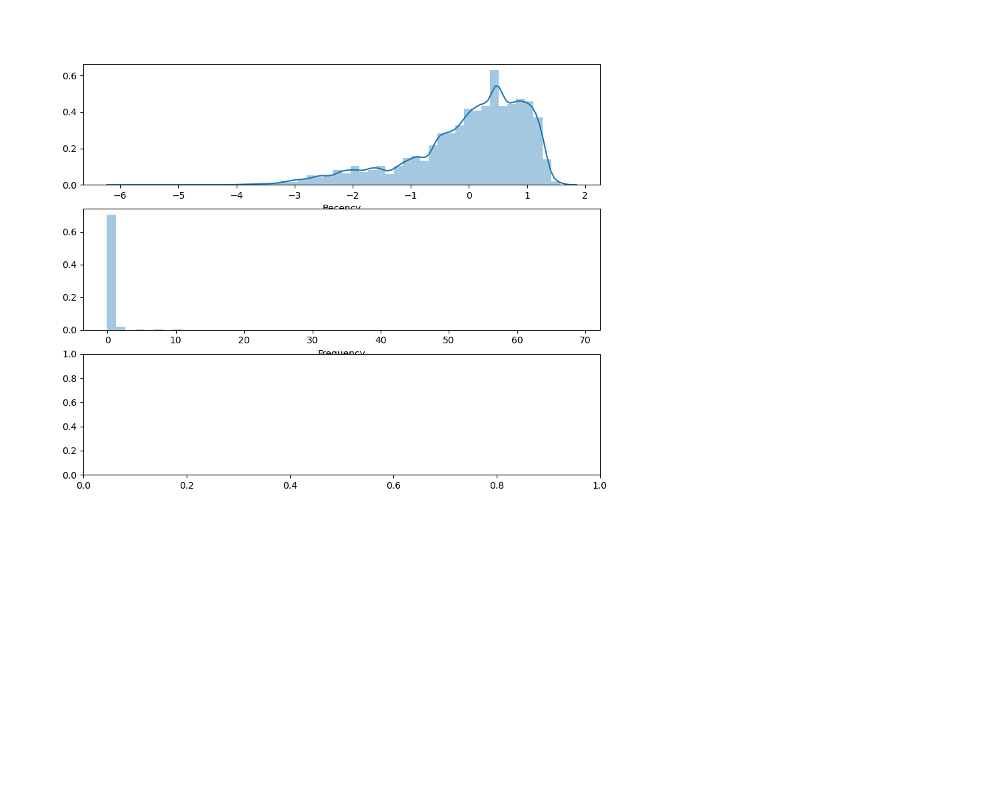

KeyError: 'Monetary'

In [115]:
plt.figure(figsize=(10,8))
# Plot distribution of Recency
plt.subplot(3, 1, 1); sns.distplot(data_normalized['Recency'])

# Plot distribution of Frequency
plt.subplot(3, 1, 2); sns.distplot(data_normalized['Frequency'])

# Plot distribution of Monetary
plt.subplot(3, 1, 3); sns.distplot(data_normalized['Monetary'])

# Show the plot
plt.show()

### centering & scaling method 2

In [48]:
from  sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(rfm_datamart_final)
rfm_normalized = scaler.transform(rfm_datamart_final)

In [49]:
rfm_normalized = pd.DataFrame(rfm_normalized, index=rfm_datamart.index, columns=rfm_datamart.columns)

In [50]:
rfm_normalized.describe().round(2)

,Recency,Frequency,Monetary
count,97932.00,97932.00,97932.00
mean,-0.00,-0.00,-0.00
std,1.00,1.00,1.00
min,-1.60,-0.12,-3.01
25%,-0.81,-0.12,-0.70
50%,-0.12,-0.12,-0.04
75%,0.71,-0.12,0.60
max,3.15,68.70,5.97


In [51]:
data_normalized.describe().round(2)

,Recency,Frequency,Monetary
count,97932.00,97932.00,97932.00
mean,-0.00,0.00,-0.00
std,1.00,1.00,1.00
min,-1.60,-0.12,-3.01
25%,-0.81,-0.12,-0.70
50%,-0.12,-0.12,-0.04
75%,0.71,-0.12,0.60
max,3.15,68.70,5.97


## Run K-Means

In [52]:
from sklearn.cluster import KMeans

In [53]:
#initialize KMeans (3 clusters)
kmeans3 = KMeans(n_clusters=3, random_state=1)
#fit kmeans on the normalized data
kmeans3.fit(data_normalized)
#extract cluster labels
cluster_labels3 = kmeans3.labels_
#create a dataframe by adding a new cluster label column
rfm_datamart_k3 = rfm_datamart.assign(Cluster = cluster_labels3)

In [54]:
#calculate average RFM values and segment sizes per cluster
k3_agg = rfm_datamart_k3.groupby('Cluster').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': ['mean','count']
})

In [55]:
#initialize KMeans (4 clusters)
kmeans = KMeans(n_clusters=4, random_state=1)

#fit kmeans on the normalized data
kmeans.fit(data_normalized)

KMeans(n_clusters=4, random_state=1)

In [56]:
#extract cluster labels
cluster_labels = kmeans.labels_

In [57]:
#create a dataframe by adding a new cluster label column
rfm_datamart_k4 = rfm_datamart.assign(Cluster = cluster_labels)

In [58]:
#calculate average RFM values and segment sizes per cluster
k4_agg = rfm_datamart_k4.groupby('Cluster').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': ['mean','count']
})

In [59]:
k3_agg.round(1)

Recency Frequency Monetary       
           mean      mean     mean  count
Cluster                                  
0         180.9       1.0    317.9  30034
1         153.5       1.0     69.2  38346
2         431.1       1.1    118.3  29552

In [60]:
k4_agg.round(1)

Recency Frequency Monetary       
           mean      mean     mean  count
Cluster                                  
0         184.1       1.0    320.5  29840
1         152.1       1.0     70.0  38570
2         431.5       1.0    115.9  29254
3         285.3       6.3    147.8    268

In [61]:
rfm_agg.round(1)

Recency Frequency Monetary       
             mean      mean     mean  count
RFM_level                                  
Low         361.2       1.0     67.8  32275
Middle      211.0       1.0    179.6  53876
Top          87.6       1.1    324.9  11781

## Deciding on the optimum number of clusters ‘K’

In [62]:
# Fit KMeans and calculate SSE for each k
sse={}
for k in range(1, 10):
    # Initialize KMeans with k clusters
    kmeans = KMeans(n_clusters=k, random_state=1)
    
    # Fit KMeans on the normalized dataset
    kmeans.fit(data_normalized)
    
    # Assign sum of squared distances to k element of dictionary
    sse[k] = kmeans.inertia_

In [63]:
sse

{1: 293793.0000001022,
 2: 224792.73458481312,
 3: 180136.0753055865,
 4: 129498.51212432177,
 5: 105955.21845989808,
 6: 90008.97714604183,
 7: 78623.8048447091,
 8: 67122.25662802863,
 9: 58140.73379351426}

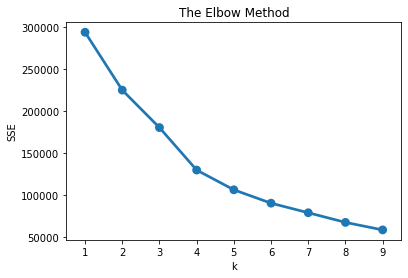

In [64]:
# Add the plot title "The Elbow Method"
plt.title('The Elbow Method')
# Add X-axis label "k"
plt.xlabel('k')
# Add Y-axis label "SSE"
plt.ylabel('SSE')
# Plot SSE values for each key in the dictionary
sns.pointplot(x=list(sse.keys()), y=list(sse.values()))
plt.show()

### Prepare data for snake plot

In [65]:
# Melt the normalized dataset and reset the index
datamart_melt_k4 = pd.melt(
    rfm_datamart_k4.reset_index(), 
    
    # Assign CustomerID and Cluster as ID variables                  
    id_vars=['customer_id', 'Cluster'],
    
    # Assign RFM values as value variables
    value_vars=['Recency', 'Frequency', 'Monetary'], 
    
    # Name the variable and value
    var_name='Metric', value_name='Value')

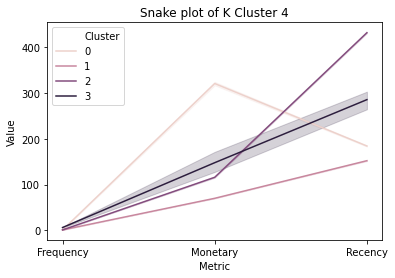

In [66]:
# Add the plot title
plt.title('Snake plot of K Cluster 4')
# Add the x axis label
plt.xlabel('Metric')
# Add the y axis label
plt.ylabel('Value')
# Plot a line for each value of the cluster variable
sns.lineplot(data=datamart_melt_k4, x='Metric', y='Value', hue='Cluster')
plt.show()

In [67]:
# Melt the normalized dataset and reset the index
datamart_melt_k3 = pd.melt(
    rfm_datamart_k3.reset_index(), 
    
    # Assign CustomerID and Cluster as ID variables                  
    id_vars=['customer_id', 'Cluster'],
    
    # Assign RFM values as value variables
    value_vars=['Recency', 'Frequency', 'Monetary'], 
    
    # Name the variable and value
    var_name='Metric', value_name='Value')

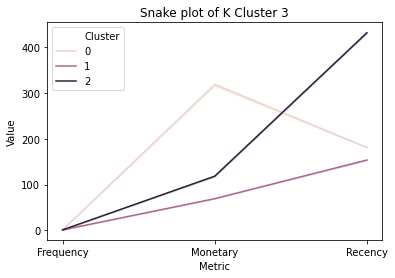

In [68]:
# Add the plot title
plt.title('Snake plot of K Cluster 3')
# Add the x axis label
plt.xlabel('Metric')
# Add the y axis label
plt.ylabel('Value')
# Plot a line for each value of the cluster variable
sns.lineplot(data=datamart_melt_k3, x='Metric', y='Value', hue='Cluster')
plt.show()

In [69]:
rfm_datamart_rfm = rfm[['Recency', 'Frequency', 'Monetary', 'RFM_level']]

In [70]:
# Melt the RFM dataset and reset the index
datamart_melt_RFM = pd.melt(
    rfm_datamart_rfm.reset_index(), 
    
    # Assign CustomerID and Cluster as ID variables                  
    id_vars=['customer_id', 'RFM_level'],
    
    # Assign RFM values as value variables
    value_vars=['Recency', 'Frequency', 'Monetary'], 
    
    # Name the variable and value
    var_name='Metric', value_name='Value')

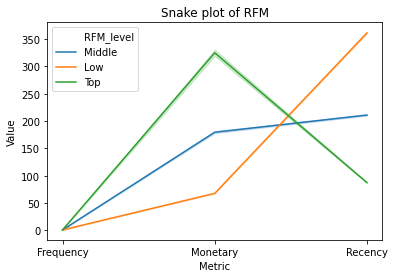

In [71]:
# Add the plot title
plt.title('Snake plot of RFM')
# Add the x axis label
plt.xlabel('Metric')
# Add the y axis label
plt.ylabel('Value')
# Plot a line for each value of the cluster variable
sns.lineplot(data=datamart_melt_RFM, x='Metric', y='Value', hue='RFM_level')
plt.show()

### Calculate relative importance of each attribute

In [72]:
# Calculate average RFM values for each cluster
cluster_avg_k3 = rfm_datamart_k3.groupby(['Cluster']).mean() 

# Calculate average RFM values for the total customer population
population_avg = rfm_datamart.mean()

# Calculate relative importance of cluster's attribute value compared to population
relative_imp_k3 = cluster_avg_k3 / population_avg - 1

# Print relative importance score rounded to 2 decimals
print(relative_imp_k3.round(2))

         Recency  Frequency  Monetary
Cluster                              
0          -0.26      -0.01      0.98
1          -0.38      -0.01     -0.57
2           0.75       0.03     -0.26


In [73]:
# Calculate average RFM values for each cluster
cluster_avg_k4 = rfm_datamart_k4.groupby(['Cluster']).mean() 

# Calculate average RFM values for the total customer population
population_avg = rfm_datamart.mean()

# Calculate relative importance of cluster's attribute value compared to population
relative_imp_k4 = cluster_avg_k4 / population_avg - 1

# Print relative importance score rounded to 2 decimals
print(relative_imp_k4.round(2))

         Recency  Frequency  Monetary
Cluster                              
0          -0.25      -0.02      1.00
1          -0.38      -0.02     -0.56
2           0.76      -0.01     -0.28
3           0.16       4.99     -0.08


In [74]:
# Calculate average RFM values for each cluster
cluster_avg_rfm = rfm_datamart_rfm.groupby(['RFM_level']).mean() 

# Calculate average RFM values for the total customer population
population_avg = rfm_datamart.mean()

# Calculate relative importance of cluster's attribute value compared to population
relative_imp_rfm = cluster_avg_rfm / population_avg - 1

# Print relative importance score rounded to 2 decimals
print(relative_imp_rfm.round(2))

           Recency  Frequency  Monetary
RFM_level                              
Low           0.47      -0.02     -0.58
Middle       -0.14       0.00      0.12
Top          -0.64       0.05      1.03


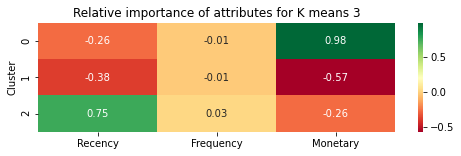

In [75]:
# Initialize a plot with a figure size of 8 by 2 inches 
plt.figure(figsize=(8, 2))

# Add the plot title
plt.title('Relative importance of attributes for K means 3')

# Plot the heatmap
sns.heatmap(data=relative_imp_k3, annot=True, fmt='.2f', cmap='RdYlGn')

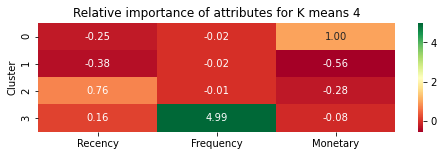

In [76]:
# Initialize a plot with a figure size of 8 by 2 inches 
plt.figure(figsize=(8, 2))

# Add the plot title
plt.title('Relative importance of attributes for K means 4')

# Plot the heatmap
sns.heatmap(data=relative_imp_k4, annot=True, fmt='.2f', cmap='RdYlGn')

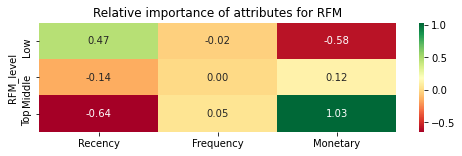

In [77]:
# Initialize a plot with a figure size of 8 by 2 inches 
plt.figure(figsize=(8, 2))

# Add the plot title
plt.title('Relative importance of attributes for RFM')

# Plot the heatmap
sns.heatmap(data=relative_imp_rfm, annot=True, fmt='.2f', cmap='RdYlGn')

## Spatial representation of segments

In [78]:
rfm_datamart_k3.head()

,Recency,Frequency,Monetary,Cluster
customer_id,,,,
9af2372a1e49340278e7c1ef8d749f34,501,27,457.99,2
92cd3ec6e2d643d4ebd0e3d6238f69e2,453,26,62.68,2
b246eeed30b362c09d867b9e598bee51,269,22,40.85,2
270c23a11d024a44c896d1894b261a83,391,21,161.32,2
eed931d3a5222a9a511d18be7fd2a5ba,479,19,82.73,2


In [79]:
high = rfm_datamart_k3.query('Cluster == 0')
mid = rfm_datamart_k3.query('Cluster == 1')
low = rfm_datamart_k3.query('Cluster == 2')

In [80]:
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

In [81]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

g1= (low['Frequency'].values, low['Recency'].values, low['Monetary'].values)
g2 = (mid['Frequency'].values, mid['Recency'].values, mid['Monetary'].values)
g3= (high['Frequency'].values, high['Recency'].values, high['Monetary'].values)

data1 = [g1, g2, g3]
colors = ['#440154FF', '#20A387FF', '#FDE725FF']
groups = ['Low', 'Med', 'High']

for data, color, group in zip(data1, colors, groups):
    x, y, z = data
    ax.scatter(x, y, z, alpha=0.5, c=color, label=group)

# Make legend
    ax.legend()
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Recency')
    ax.set_zlabel('Monetary')
    ax.set_title('Spatial Representation of Segments', loc='left')
    plt.show()


<IPython.core.display.Javascript object>

In [82]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(rfm_datamart_rfm.Recency[rfm_datamart_rfm.RFM_level == 'Top'], rfm_datamart_rfm.Frequency[rfm_datamart_rfm.RFM_level == 'Top'], rfm_datamart_rfm.Monetary[rfm_datamart_rfm.RFM_level == 'Top'], c='blue', s=60)
ax.scatter(rfm_datamart_rfm.Recency[rfm_datamart_rfm.RFM_level == 'Middle'], rfm_datamart_rfm.Frequency[rfm_datamart_rfm.RFM_level == 'Middle'], rfm_datamart_rfm.Monetary[rfm_datamart_rfm.RFM_level == 'Middle'], c='green', s=60)
ax.scatter(rfm_datamart_rfm.Recency[rfm_datamart_rfm.RFM_level == 'Low'], rfm_datamart_rfm.Frequency[rfm_datamart_rfm.RFM_level == 'Low'], rfm_datamart_rfm.Monetary[rfm_datamart_rfm.RFM_level == 'Low'], c='red', s=60)
ax.view_init(30, 185)
plt.xlabel("Recency")
plt.ylabel("Frequency")
ax.set_zlabel('Monetary')
plt.show()

<IPython.core.display.Javascript object>

In [83]:
import plotly.graph_objects as go

In [84]:
# 3D chart for RFM
fig = go.Figure()
fig.add_trace(go.Mesh3d(x= rfm_datamart_rfm.Recency[rfm_datamart_rfm.RFM_level == 'Top'], 
                        y= rfm_datamart_rfm.Frequency[rfm_datamart_rfm.RFM_level == 'Top'],
                        z= rfm_datamart_rfm.Monetary[rfm_datamart_rfm.RFM_level == 'Top'],
                        opacity=0.5,
                        color='blue'
                       ))
fig.add_trace(go.Mesh3d(x= rfm_datamart_rfm.Recency[rfm_datamart_rfm.RFM_level == 'Middle'], 
                        y= rfm_datamart_rfm.Frequency[rfm_datamart_rfm.RFM_level == 'Middle'],
                        z= rfm_datamart_rfm.Monetary[rfm_datamart_rfm.RFM_level == 'Middle'],
                         opacity=0.5,
                         color='pink'
                        ))
fig.add_trace(go.Mesh3d(x= rfm_datamart_rfm.Recency[rfm_datamart_rfm.RFM_level == 'Low'], 
                        y= rfm_datamart_rfm.Frequency[rfm_datamart_rfm.RFM_level == 'Low'],
                        z= rfm_datamart_rfm.Monetary[rfm_datamart_rfm.RFM_level == 'Low'],
                         opacity=0.5,
                         color='yellow'
                        ))

fig.update_layout(scene = dict(
                    xaxis_title='Recency',
                    yaxis_title='Frequency',
                    zaxis_title='Monetary'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10))

fig.show()

In [85]:
# 3D chart for K3
fig2 = go.Figure()
fig2.add_trace(go.Mesh3d(x= rfm_datamart_k3.Recency[rfm_datamart_k3.Cluster == 0], 
                        y= rfm_datamart_k3.Frequency[rfm_datamart_k3.Cluster == 0],
                        z= rfm_datamart_k3.Monetary[rfm_datamart_k3.Cluster == 0],
                        opacity=0.5,
                        color='blue'
                       ))
fig2.add_trace(go.Mesh3d(x= rfm_datamart_k3.Recency[rfm_datamart_k3.Cluster == 1], 
                        y= rfm_datamart_k3.Frequency[rfm_datamart_k3.Cluster == 1],
                        z= rfm_datamart_k3.Monetary[rfm_datamart_k3.Cluster == 1],
                         opacity=0.5,
                         color='pink'
                        ))
fig2.add_trace(go.Mesh3d(x= rfm_datamart_k3.Recency[rfm_datamart_k3.Cluster == 2], 
                        y= rfm_datamart_k3.Frequency[rfm_datamart_k3.Cluster == 2],
                        z= rfm_datamart_k3.Monetary[rfm_datamart_k3.Cluster == 2],
                         opacity=0.5,
                         color='yellow'
                        ))

fig2.update_layout(scene = dict(
                    xaxis_title='Recency',
                    yaxis_title='Frequency',
                    zaxis_title='Monetary'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10))

fig2.show()

# Calculating CLTV (Customer Lifetime Value)

In [86]:
rfm_ltv = rfm[['Recency', 'Frequency', 'Monetary', 'RFM_score', 'RFM_level']]

In [87]:
import plotly.offline as pyoff

plot_data = [
    go.Scatter(
        x=rfm_ltv.query("RFM_level == 'Low'")['RFM_score'],
        y=rfm_ltv.query("RFM_level == 'Low'")['Monetary'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'yellow',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=rfm_ltv.query("RFM_level == 'Middle'")['RFM_score'],
        y=rfm_ltv.query("RFM_level == 'Middle'")['Monetary'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'pink',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=rfm_ltv.query("RFM_level == 'Top'")['RFM_score'],
        y=rfm_ltv.query("RFM_level == 'Top'")['Monetary'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Payments"},
        xaxis= {'title': "RFM Score"},
        title='LTV'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [88]:
rfm_ltv

,Recency,Frequency,Monetary,RFM_score,RFM_level
customer_id,,,,,
9af2372a1e49340278e7c1ef8d749f34,501,27,457.99,6.0,Middle
92cd3ec6e2d643d4ebd0e3d6238f69e2,453,26,62.68,4.0,Low
b246eeed30b362c09d867b9e598bee51,269,22,40.85,5.0,Middle
270c23a11d024a44c896d1894b261a83,391,21,161.32,6.0,Middle
eed931d3a5222a9a511d18be7fd2a5ba,479,19,82.73,5.0,Middle
...,...,...,...,...,...
56de1e86668961e5442c922e3762b620,17,1,175.90,7.0,Top
56dde5ae4a599923a54ea1c9a64c3094,85,1,153.40,7.0,Top
56dde41c7bb48ff317cf71625ee3b33c,335,1,96.80,4.0,Low


In [89]:
data.head()

AttributeError: 'tuple' object has no attribute 'head'